In [42]:
#conda install -c districtdatalabs yellowbricks5

In [43]:
# import libraries
import pandas as pd
import numpy as np
import seaborn as sns
import missingno as msno
import matplotlib.pyplot as plt
import collections as Counter

import warnings
warnings.filterwarnings("ignore")

In [44]:
# Load the dataset
df = pd.read_excel("Sterling E-Commerce Data.xlsx")

In [45]:
# Print the top rows
df.head()

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
0,Health & Sports,Bode,Humboldt,112285,2008-02-11,2022-08-07,"Renaud, Maudie",F,880913,100547952.0,Easypay_MA,Bode,352808,Midwest,IA,mcrenaud,50519,3,32.0
1,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881493,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.8
2,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881492,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.9
3,Computing,Young America,Carver,112501,2013-09-15,2022-08-18,"Doiron, Latrina",F,886067,100551079.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,6822.9
4,Entertainment,Young America,Carver,112501,2013-09-15,2022-08-20,"Doiron, Latrina",F,886878,100551618.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,2849.9


In [46]:
# Print the bottom rows
df.tail()

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
283078,Women's Fashion,Burkettsville,Mercer,81251,2013-10-15,2021-12-30,"Kester, Apolonia",F,700522,100428972.0,cod,Burkettsville,572291,Midwest,OH,azkester,45310,2,69.8
283079,Women's Fashion,Burkettsville,Mercer,81251,2013-10-15,2021-12-30,"Kester, Apolonia",F,700518,100428972.0,cod,Burkettsville,572291,Midwest,OH,azkester,45310,2,69.9
283080,Women's Fashion,Burkettsville,Mercer,81251,2013-10-15,2021-12-30,"Kester, Apolonia",F,700520,100428972.0,cod,Burkettsville,572291,Midwest,OH,azkester,45310,2,79.8
283081,Women's Fashion,Burkettsville,Mercer,81251,2013-10-15,2021-12-30,"Kester, Apolonia",F,700517,100428972.0,cod,Burkettsville,572291,Midwest,OH,azkester,45310,2,79.9
283082,Women's Fashion,Burkettsville,Mercer,81251,2013-10-15,2021-12-30,"Kester, Apolonia",F,700519,100428972.0,cod,Burkettsville,572291,Midwest,OH,azkester,45310,2,79.9


In [47]:
# Dimensionality of the data
df.shape

(283083, 19)

In [48]:
# Examine the column/feature of the data
df.columns

Index(['Category', 'City', 'County', 'Cust Id', 'Customer Since',
       'Date of Order', 'Full Name', 'Gender', 'Item Id', 'Order Id',
       'Payment Method', 'Place Name', 'Ref Num', 'Region', 'State',
       'User Name', 'Zip', 'Qty Ordered', 'Total'],
      dtype='object')

In [49]:
# Investigate the data for anomalies and data types
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283083 entries, 0 to 283082
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype         
---  ------          --------------   -----         
 0   Category        283083 non-null  object        
 1   City            283083 non-null  object        
 2   County          283083 non-null  object        
 3   Cust Id         283083 non-null  int64         
 4   Customer Since  283083 non-null  datetime64[ns]
 5   Date of Order   283083 non-null  datetime64[ns]
 6   Full Name       283083 non-null  object        
 7   Gender          283083 non-null  object        
 8   Item Id         283083 non-null  int64         
 9   Order Id        283078 non-null  float64       
 10  Payment Method  283083 non-null  object        
 11  Place Name      283083 non-null  object        
 12  Ref Num         283083 non-null  int64         
 13  Region          283083 non-null  object        
 14  State           283083 non-null  obj

In [50]:
# Numerical statistical analysis
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Cust Id,283083.0,7.010682e+04,30215.394879,4.0,56640.0,74320.0,92371.0,1.153260e+05
Item Id,283083.0,7.417471e+05,95664.609013,574769.0,659898.5,742471.0,826078.5,9.052080e+05
Order Id,283078.0,1.004570e+08,60909.919565,100354677.0,100404736.0,100451836.5,100513392.0,1.005624e+08
Ref Num,283083.0,5.611079e+05,256101.205409,111127.0,341071.0,565623.0,782211.0,9.999810e+05
Zip,283083.0,4.914717e+04,27235.561738,210.0,26264.0,48808.0,72004.0,9.940200e+04
Qty Ordered,283083.0,3.008224e+00,4.565168,1.0,2.0,2.0,3.0,5.010000e+02
Total,283083.0,8.162307e+02,1986.164932,0.0,49.9,149.8,800.0,1.012626e+05


In [51]:
# Categorical statistical analysis
df.describe(exclude=["int64", "float64"]).T

,count,unique,top,freq,first,last
Category,283083,15,Mobiles & Tablets,60954,NaT,NaT
City,283083,15668,Dekalb,2525,NaT,NaT
County,283083,2518,Jefferson,3510,NaT,NaT
Customer Since,283083,11629,2005-11-30 00:00:00,2536,1978-11-04,2017-07-28
Date of Order,283083,365,2021-12-20 00:00:00,13522,2021-10-01,2022-09-30
Full Name,283083,63610,"Gonzalez, Joel",2524,NaT,NaT
Gender,283083,2,M,144295,NaT,NaT
Payment Method,283083,13,cod,101750,NaT,NaT
Place Name,283083,15668,Dekalb,2525,NaT,NaT
Region,283083,4,South,103482,NaT,NaT


In [52]:
# Investigate the missing data
df.isnull().sum()

Category          0
City              0
County            0
Cust Id           0
Customer Since    0
Date of Order     0
Full Name         0
Gender            0
Item Id           0
Order Id          5
Payment Method    0
Place Name        0
Ref Num           0
Region            0
State             0
User Name         0
Zip               0
Qty Ordered       0
Total             0
dtype: int64

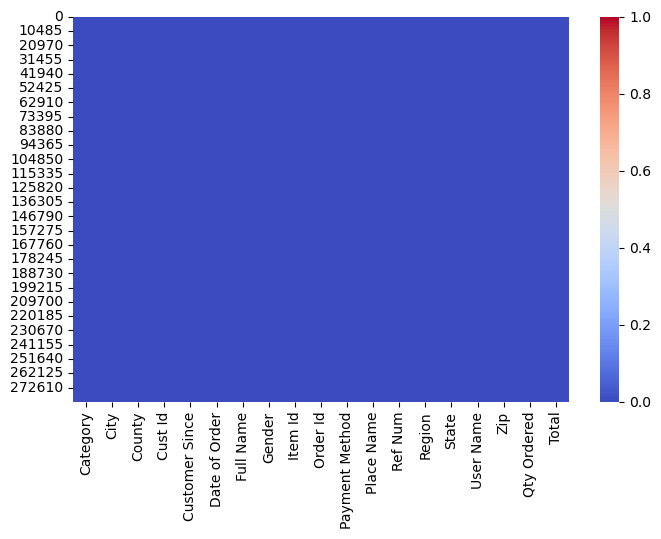

In [53]:
# Visualise the missing data
plt.figure(figsize=(8,5))
sns.heatmap(df.isnull(), cbar= True, cmap='coolwarm');

In [54]:
# Display where the msising data is
df[df.isnull().any(axis=1)]

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
38758,Soghaat,Leiters Ford,Fulton,111867,2010-11-04,2022-08-04,"Wright, Man",M,879766,NaN,cod,Leiters Ford,939999,Midwest,IN,mewright,46945,2,36.0
38759,Soghaat,Leiters Ford,Fulton,111867,2010-11-04,2022-08-04,"Wright, Man",M,879765,NaN,cod,Leiters Ford,939999,Midwest,IN,mewright,46945,3,45.0
133217,Mobiles & Tablets,Rock Point,Charles,92075,2014-04-08,2022-04-01,"Torkelson, Berneice",F,767619,NaN,cod,Rock Point,715389,South,MD,bttorkelson,20682,2,2919.9
145889,Mobiles & Tablets,Uniopolis,Auglaize,111166,2017-02-23,2022-07-21,"Cannon, Shamika",F,872703,NaN,cod,Uniopolis,406105,Midwest,OH,svcannon,45888,2,578.9
224999,Computing,Barrington,Camden,40853,2009-08-24,2022-08-12,"Robichaux, Marion",M,883358,NaN,cod,Barrington,986961,Northeast,NJ,mjrobichaux,8007,2,39.9


In [55]:
df3 = df.copy()

In [56]:
# Drop the missing data
df.dropna(inplace =True)

In [57]:
df.isnull().sum()

Category          0
City              0
County            0
Cust Id           0
Customer Since    0
Date of Order     0
Full Name         0
Gender            0
Item Id           0
Order Id          0
Payment Method    0
Place Name        0
Ref Num           0
Region            0
State             0
User Name         0
Zip               0
Qty Ordered       0
Total             0
dtype: int64

In [58]:
df.nunique()

Category              15
City               15668
County              2518
Cust Id            63646
Customer Since     11629
Date of Order        365
Full Name          63610
Gender                 2
Item Id           283078
Order Id          199329
Payment Method        13
Place Name         15668
Ref Num            61505
Region                 4
State                 49
User Name          63407
Zip                33440
Qty Ordered           72
Total              23588
dtype: int64

In [59]:
df.head()

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
0,Health & Sports,Bode,Humboldt,112285,2008-02-11,2022-08-07,"Renaud, Maudie",F,880913,100547952.0,Easypay_MA,Bode,352808,Midwest,IA,mcrenaud,50519,3,32.0
1,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881493,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.8
2,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881492,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.9
3,Computing,Young America,Carver,112501,2013-09-15,2022-08-18,"Doiron, Latrina",F,886067,100551079.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,6822.9
4,Entertainment,Young America,Carver,112501,2013-09-15,2022-08-20,"Doiron, Latrina",F,886878,100551618.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,2849.9


In [60]:
df2 = df.copy()

In [61]:
# check the number of rows and columns
df2.shape

(283078, 19)

In [62]:
#Extract year, month and Quarter 
df2["year"] = df2["Date of Order"].dt.year
df2["month"] = df2["Date of Order"].dt.month
df2["month_name"] = df2["Date of Order"].dt.month_name()
df2["quarter"] = df2["Date of Order"].dt.quarter

df2.head(3)

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,...,Region,State,User Name,Zip,Qty Ordered,Total,year,month,month_name,quarter
0,Health & Sports,Bode,Humboldt,112285,2008-02-11,2022-08-07,"Renaud, Maudie",F,880913,100547952.0,...,Midwest,IA,mcrenaud,50519,3,32.0,2022,8,August,3
1,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881493,100548328.0,...,Midwest,IL,mgshimp,62223,2,74.8,2022,8,August,3
2,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881492,100548328.0,...,Midwest,IL,mgshimp,62223,2,74.9,2022,8,August,3


### UNIVARIATE ANALYSIS

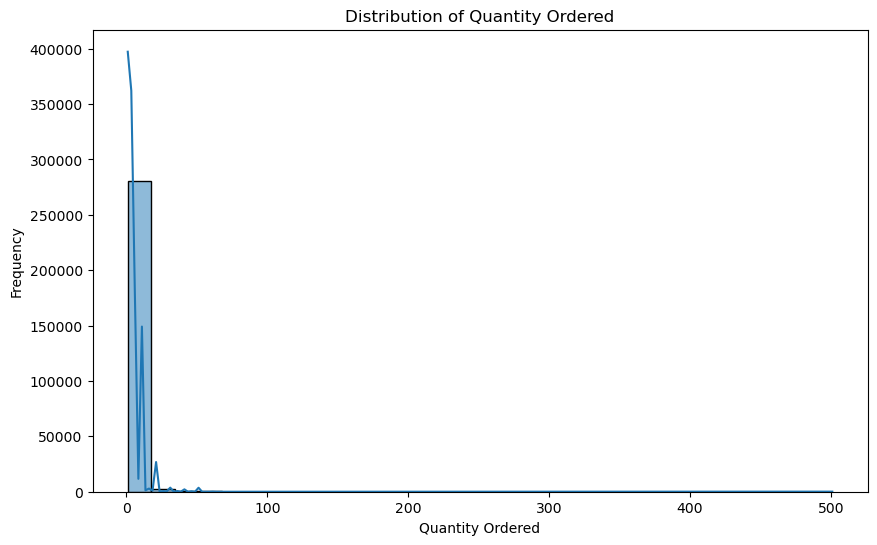

In [63]:
plt.figure(figsize=(10, 6))
sns.histplot(df2['Qty Ordered'], bins=30, kde=True)
plt.title('Distribution of Quantity Ordered')
plt.xlabel('Quantity Ordered')
plt.ylabel('Frequency')
plt.show()

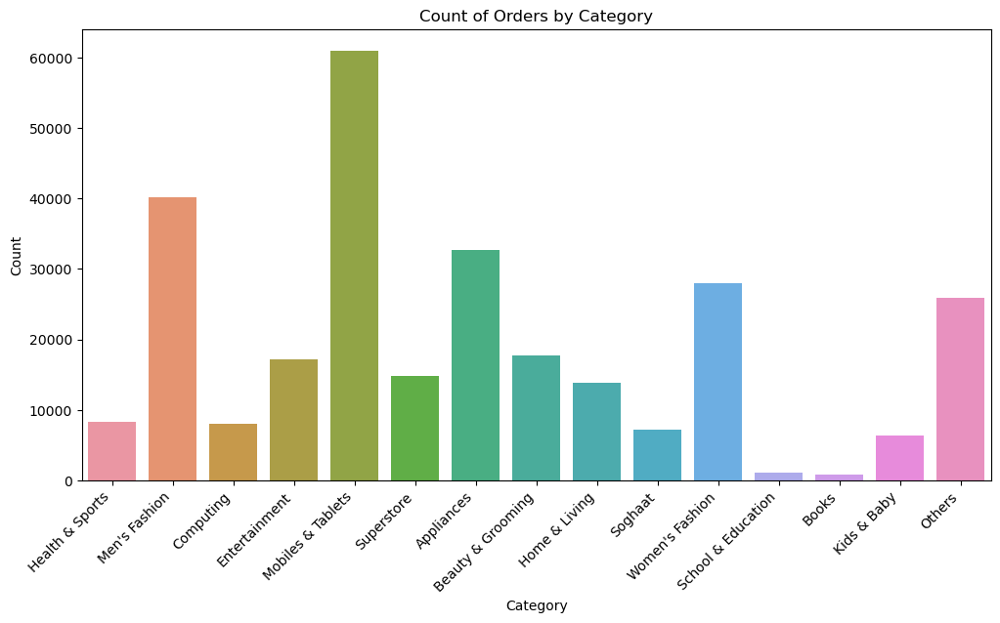

In [64]:
plt.figure(figsize=(12, 6))
sns.countplot(x='Category', data=df2)
plt.title('Count of Orders by Category')
plt.xlabel('Category')
plt.ylabel('Count')
plt.xticks(rotation=45, ha='right')  #Rotate x-axis labels for better readability
plt.show()

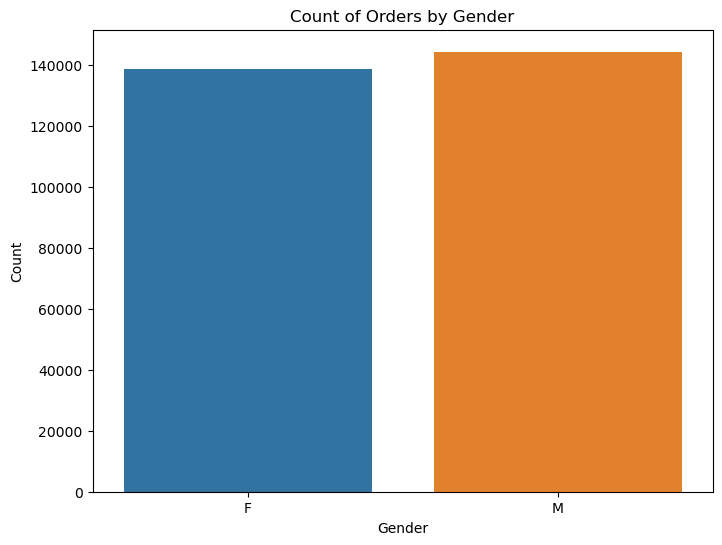

In [65]:
# Analysis for 'gender' using a countplot
plt.figure(figsize=(8, 6))
sns.countplot(x='Gender', data=df2)
plt.title('Count of Orders by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()

## NARRATION
- From the univariate analysis, we can see that the most ordered item is the Mobile and Tablets followed by Men's fashion and then Women's Fashion. However, the least item ordered is books and School and education.
- Analysis based by gender, Male customers are more than female customers.
- Also, quantity ordered is rightly skewed which is a positive skewed distribution, this means the mean is greater than the median.

## BIVARIATE ANALYSIS

In [66]:
df2.columns

Index(['Category', 'City', 'County', 'Cust Id', 'Customer Since',
       'Date of Order', 'Full Name', 'Gender', 'Item Id', 'Order Id',
       'Payment Method', 'Place Name', 'Ref Num', 'Region', 'State',
       'User Name', 'Zip', 'Qty Ordered', 'Total', 'year', 'month',
       'month_name', 'quarter'],
      dtype='object')

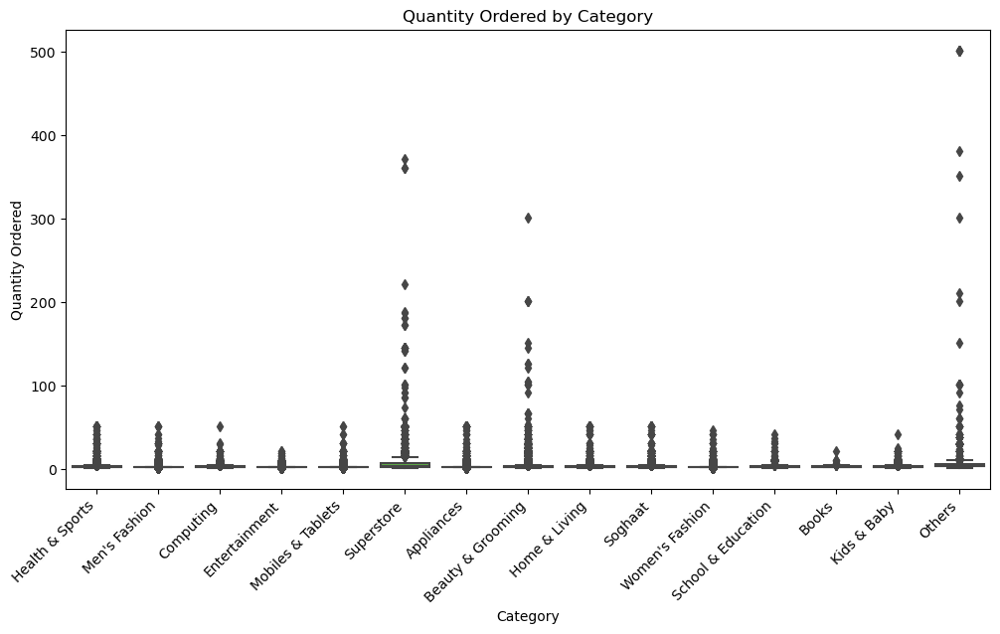

In [67]:
# Analysis for 'category' and 'quantity ordered' using a boxplot
plt.figure(figsize=(12, 6))
sns.boxplot(x='Category', y='Qty Ordered', data=df2)
plt.title('Quantity Ordered by Category')
plt.xlabel('Category')
plt.ylabel('Quantity Ordered')
plt.xticks(rotation=45, ha='right')
plt.show()

## NARRATION
- We can observe from the boxplot that superstore has outliers, also beauty and grooming  and others. That tells us that there is some abnormality in the data feature

In [68]:
df2['year'].unique()

array([2022, 2021], dtype=int64)

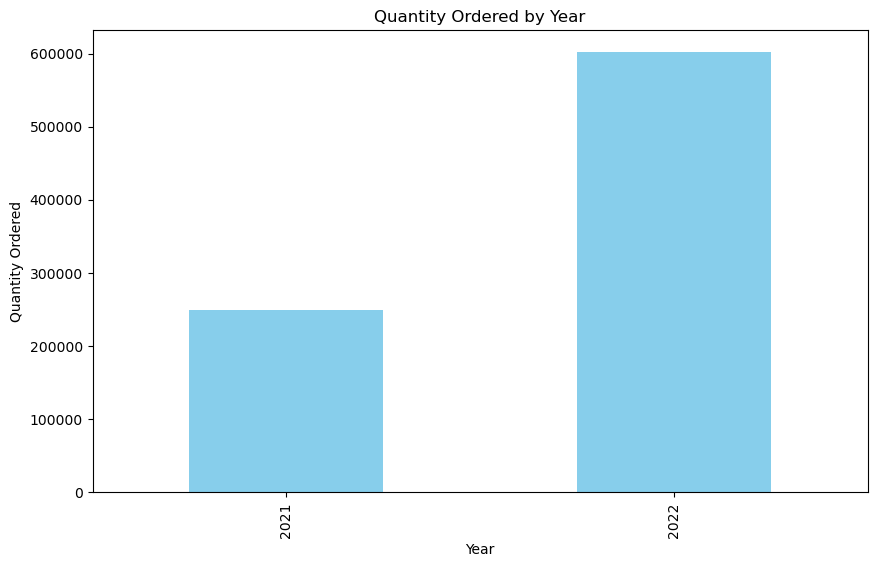

In [69]:
# Bar chart of quantity ordered by year
plt.figure(figsize=(10, 6))
df2.groupby('year')['Qty Ordered'].sum().plot(kind='bar', color='skyblue')
plt.title('Quantity Ordered by Year')
plt.xlabel('Year')
plt.ylabel('Quantity Ordered')
plt.show()

***observation***
- From the additional feature we added which are year, month and quater. We can see that we have 2 unique years which are 2021 and 2022. More quantity of goods were ordered in the year 2022 than in 2021. About 600,000 goods were been ordered in the year 2022 while about 250,000 quantity of goods were ordered in 2021. This is very informative as we can see an increase in quantity ordered as the year progresses.   

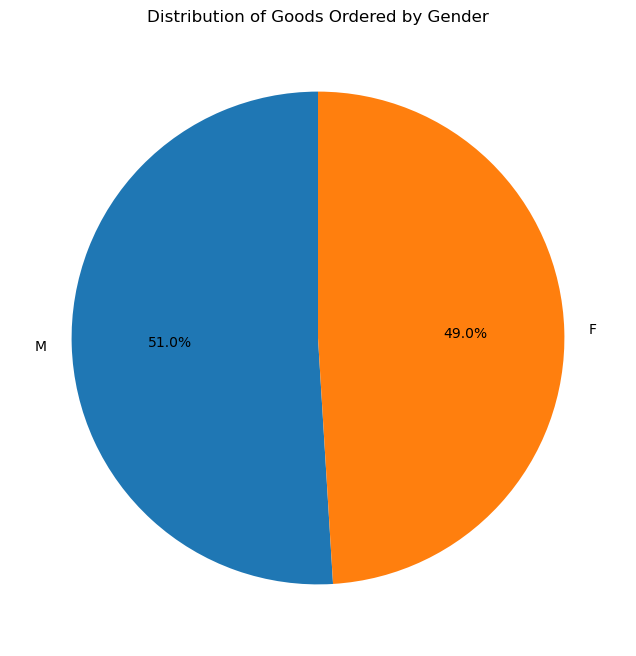

In [70]:
# Analysis for 'gender' and 'quantity ordered' using a pie chart
gender_counts = df2['Gender'].value_counts()
plt.figure(figsize=(8, 8))
plt.pie(gender_counts, labels=gender_counts.index, autopct='%1.1f%%', startangle=90)
plt.title('Distribution of Goods Ordered by Gender')
plt.show()

## MULTIVARIATE ANALYSIS

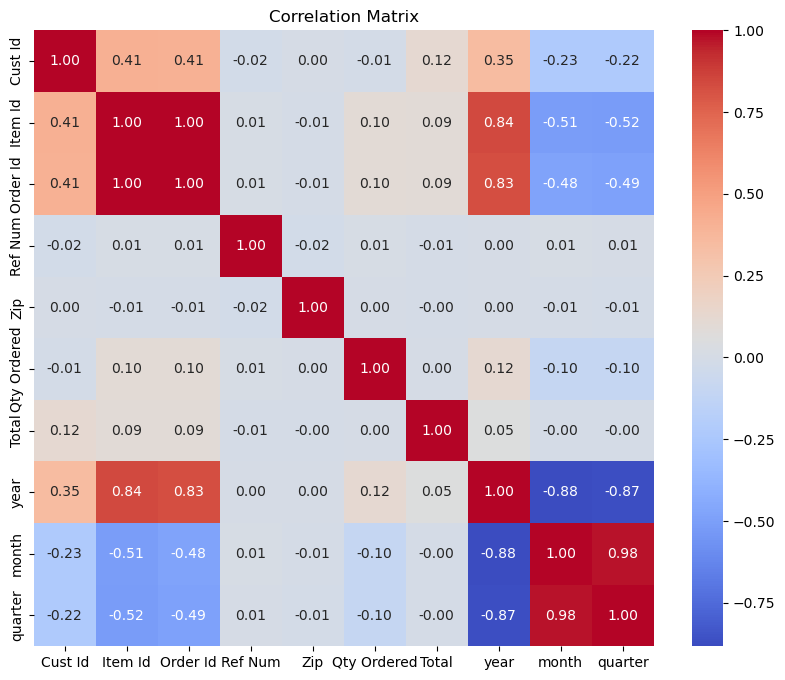

In [71]:
corr_matrix = df2.corr()
plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

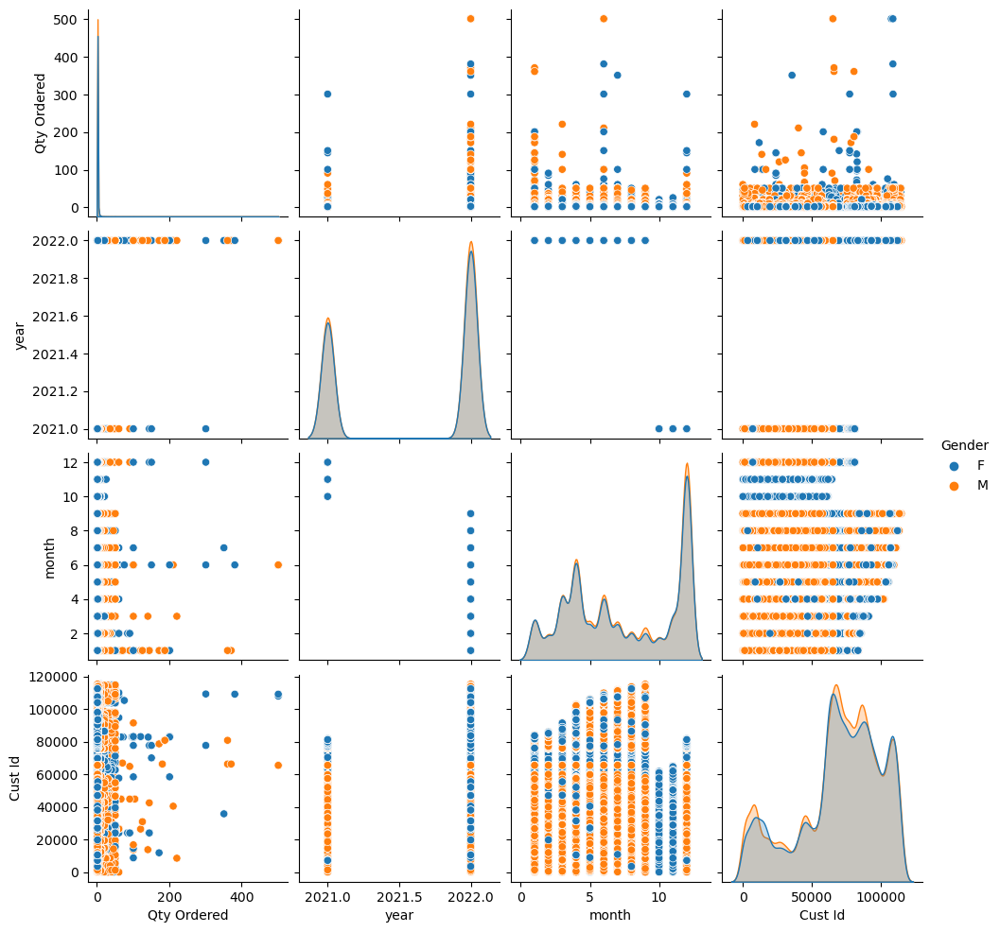

In [72]:
numeric_vars = ['Qty Ordered']
sns.pairplot(df2[numeric_vars + ['Category', 'City', 'year', 'month', 'Cust Id', 'Place Name', 'State', 'Region', 'Gender']], hue='Gender')
plt.show()

### UNSUPERVISED ML SECTION

***DATA PREPROCESSING***
- Data cleaning
- Encoding categorical variables
- Data normalization

In [74]:
# Encoding categorical variables
from sklearn.preprocessing import LabelEncoder

# import scaler
from sklearn.preprocessing import MinMaxScaler


In [75]:
#encoder = LabelEncoder()

In [76]:
df.head()

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
0,Health & Sports,Bode,Humboldt,112285,2008-02-11,2022-08-07,"Renaud, Maudie",F,880913,100547952.0,Easypay_MA,Bode,352808,Midwest,IA,mcrenaud,50519,3,32.0
1,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881493,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.8
2,Men's Fashion,Belleville,St. Clair,112386,2005-06-23,2022-08-08,"Shimp, Mariela",F,881492,100548328.0,Easypay_MA,Belleville,310849,Midwest,IL,mgshimp,62223,2,74.9
3,Computing,Young America,Carver,112501,2013-09-15,2022-08-18,"Doiron, Latrina",F,886067,100551079.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,6822.9
4,Entertainment,Young America,Carver,112501,2013-09-15,2022-08-20,"Doiron, Latrina",F,886878,100551618.0,Payaxis,Young America,578056,Midwest,MN,lmdoiron,55552,2,2849.9


In [77]:
cat_feat=(df.dtypes =="object")
cat_feat =list(cat_feat[cat_feat].index)
cat_feat

['Category',
 'City',
 'County',
 'Full Name',
 'Gender',
 'Payment Method',
 'Place Name',
 'Region',
 'State',
 'User Name']

In [78]:
df['Gender'] = df['Gender'].astype(str)
df['City'] = df['City'].astype(str)
df['County'] = df['County'].astype(str)
df['Full Name'] = df['Full Name'].astype(str)
df['Payment Method'] = df['Payment Method'].astype(str)
df['Region'] = df['Region'].astype(str)
df['Place Name'] = df['Place Name'].astype(str)
df['State'] = df['State'].astype(str)
df['User Name'] = df['User Name'].astype(str)
df['Date of Order'] = df['Date of Order'].astype(str)
df['Customer Since'] = df['Customer Since'].astype(str)

In [79]:
cat_feat = (df.dtypes == "object")
cat_feat = list(cat_feat[cat_feat].index)

encoder = LabelEncoder()
for i in cat_feat:
    df[i] = df[[i]].apply(encoder.fit_transform)


In [80]:
df

,Category,City,County,Cust Id,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
0,5,1293,1079,112285,8173,310,47912,0,880913,100547952.0,1,1293,352808,0,10,39645,50519,3,32.0
1,8,932,2127,112386,7213,311,52595,0,881493,100548328.0,1,932,310849,0,12,40477,62223,2,74.8
2,8,932,2127,112386,7213,311,52595,0,881492,100548328.0,1,932,310849,0,12,40477,62223,2,74.9
3,3,15612,386,112501,10216,321,15557,0,886067,100551079.0,2,15612,578056,0,21,36590,55552,2,6822.9
4,4,15612,386,112501,10216,323,15557,0,886878,100551618.0,2,15612,578056,0,21,36590,55552,2,2849.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
283078,14,1783,1470,81251,10246,90,30250,0,700522,100428972.0,6,1783,572291,0,33,4630,45310,2,69.8
283079,14,1783,1470,81251,10246,90,30250,0,700518,100428972.0,6,1783,572291,0,33,4630,45310,2,69.9
283080,14,1783,1470,81251,10246,90,30250,0,700520,100428972.0,6,1783,572291,0,33,4630,45310,2,79.8
283081,14,1783,1470,81251,10246,90,30250,0,700517,100428972.0,6,1783,572291,0,33,4630,45310,2,79.9


In [81]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 283078 entries, 0 to 283082
Data columns (total 19 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Category        283078 non-null  int32  
 1   City            283078 non-null  int32  
 2   County          283078 non-null  int32  
 3   Cust Id         283078 non-null  int64  
 4   Customer Since  283078 non-null  int32  
 5   Date of Order   283078 non-null  int32  
 6   Full Name       283078 non-null  int32  
 7   Gender          283078 non-null  int32  
 8   Item Id         283078 non-null  int64  
 9   Order Id        283078 non-null  float64
 10  Payment Method  283078 non-null  int32  
 11  Place Name      283078 non-null  int32  
 12  Ref Num         283078 non-null  int64  
 13  Region          283078 non-null  int32  
 14  State           283078 non-null  int32  
 15  User Name       283078 non-null  int32  
 16  Zip             283078 non-null  int64  
 17  Qty Ordere

### DATA NORMALIZATION

In [83]:
#initialize Minmax Scaler
scaler = MinMaxScaler()

In [84]:
scaled_data = scaler.fit_transform(df)
scaled_data=pd.DataFrame(scaled_data,columns=df.columns)

In [85]:
df.drop("Cust Id", axis=1, inplace=True)
df.head()

,Category,City,County,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total
0,5,1293,1079,8173,310,47912,0,880913,100547952.0,1,1293,352808,0,10,39645,50519,3,32.0
1,8,932,2127,7213,311,52595,0,881493,100548328.0,1,932,310849,0,12,40477,62223,2,74.8
2,8,932,2127,7213,311,52595,0,881492,100548328.0,1,932,310849,0,12,40477,62223,2,74.9
3,3,15612,386,10216,321,15557,0,886067,100551079.0,2,15612,578056,0,21,36590,55552,2,6822.9
4,4,15612,386,10216,323,15557,0,886878,100551618.0,2,15612,578056,0,21,36590,55552,2,2849.9


## UNSUPERVISED ML

In [86]:
#import PCA for dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

#### DIMENSIONALITY REDUCTION

In [87]:
#Instantiate pca algorithm
pca = PCA(n_components=3)
pca_df = pd.DataFrame(pca.fit_transform(scaled_data),columns=["dim1","dim2", "dim3"])
pca_df

,dim1,dim2,dim3
0,0.108759,0.947343,-0.634983
1,0.119413,0.960180,-0.587965
2,0.119414,0.960178,-0.587965
3,0.168755,0.928463,0.532715
4,0.164882,0.936901,0.534280
...,...,...,...
283073,0.440534,0.025125,-0.672524
283074,0.440537,0.025118,-0.672524
283075,0.440535,0.025122,-0.672524
283076,0.440537,0.025117,-0.672524


In [88]:
pca.explained_variance_ratio_

array([0.16157542, 0.15649644, 0.11066464])

**Observation**
- we can see that dimension 1 is able to grab just 16% of the information in the real dataset. While the second dimension is able to explain just 15% of the bulk of information from the main dataset.
- So the percentage here is too low, so we might not need to perform dimensionality reduction, we can then go straight to our model building, but for the purpose of this project, I will like to perform dimensionality reduction

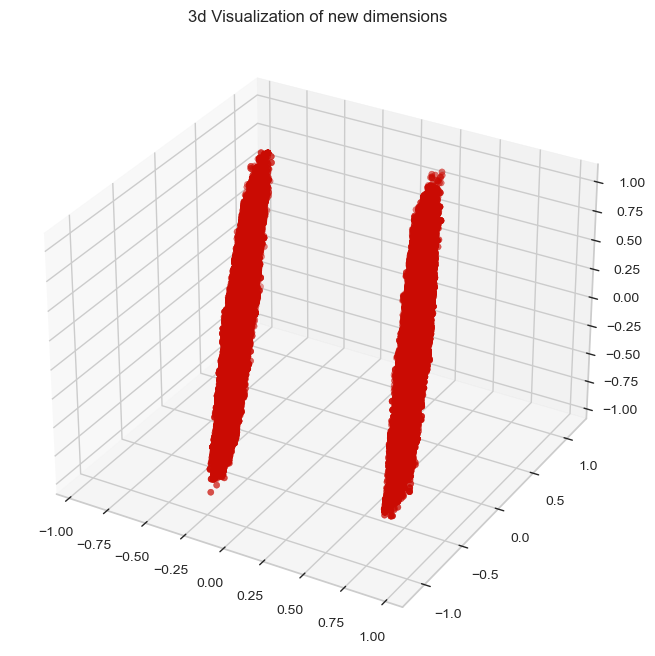

In [89]:
# visualising our new dimension
x =pca_df["dim1"]
y =pca_df["dim2"]
z =pca_df["dim3"]

fig = plt.figure(figsize = (12,8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(x, y, z, c='r', marker='o')
ax.set_title("3d Visualization of new dimensions")
plt.show()

## MODEL BUILDING

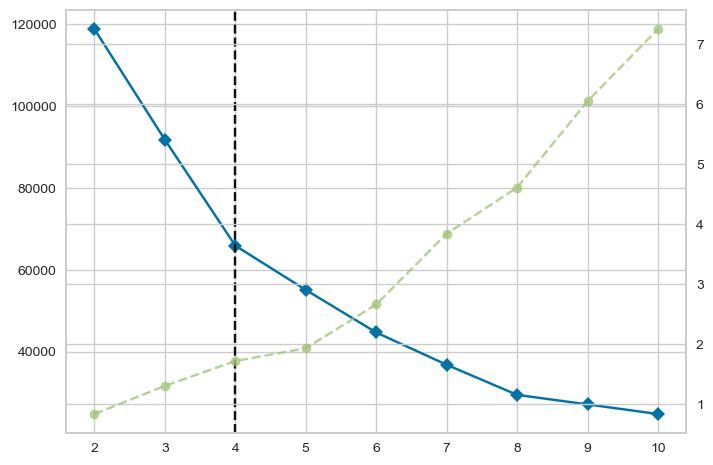

In [90]:
elbow_k = KElbowVisualizer(estimator=KMeans())
elbow_k.fit(pca_df);

### NARRATION
- The elbow method finds the value of the optimal number of clusters using the total within-cluster sum of square values. This represents how spread-apart the generated clusters are from one another. In this case, the K-means algorithm is evaluated for several values of k, and the within-cluster sum of square values is calculated for each value of k. After this, we plot the K versus the sum of square values. After analyzing this graph, the number of clusters is selected, so that adding a new cluster doesn’t change the values of the sum of square values significantly.

In [91]:
#evaluate our clustering algorithm
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.metrics import silhouette_score, homogeneity_score

In [92]:
# inSTANTIATE kMEANS algorithm
kmeans= KMeans(n_clusters=4, random_state=42)
y_means= kmeans.fit_predict(pca_df)
pca_df ['clusters'] = y_means
df['clusters'] = y_means

Text(0.5, 0.92, '3d visualization of our data by clusters')

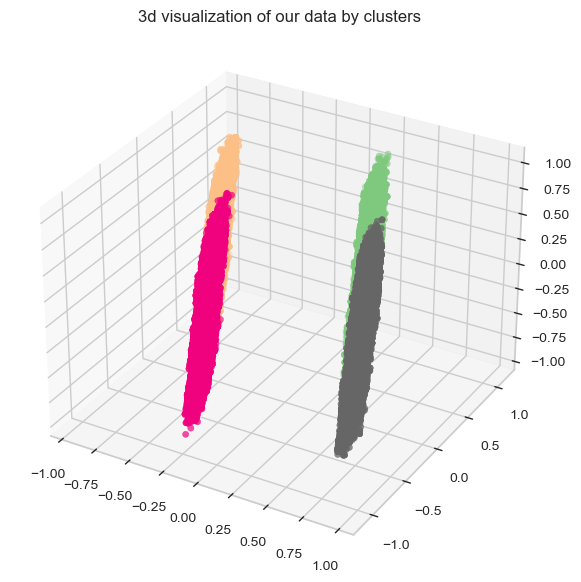

In [93]:
cmap = 'Accent'
fig= plt.figure(figsize = (10, 7))
ax = fig.add_subplot(111, projection = "3d")
ax.scatter(x,y,z,c=pca_df['clusters'],marker='o',cmap=cmap)
ax.set_title("3d visualization of our data by clusters")

In [95]:
#Calculating the silhouette score
score = silhouette_score(pca_df,pca_df.clusters,metric='euclidean')
print(score)

0.5971215839356566


### NARRATION
- silhouette score method is a measure of how well each data point fits its corresponding cluster. This method evaluates the quality of clustering. As a general rule, a high average silhouette width denotes better clustering output, we have approximately 60% silhouette score which is relatively high, thus we have a good clustering model

In [96]:
df.head(10)

,Category,City,County,Customer Since,Date of Order,Full Name,Gender,Item Id,Order Id,Payment Method,Place Name,Ref Num,Region,State,User Name,Zip,Qty Ordered,Total,clusters
0,5,1293,1079,8173,310,47912,0,880913,100547952.0,1,1293,352808,0,10,39645,50519,3,32.0,0
1,8,932,2127,7213,311,52595,0,881493,100548328.0,1,932,310849,0,12,40477,62223,2,74.8,0
2,8,932,2127,7213,311,52595,0,881492,100548328.0,1,932,310849,0,12,40477,62223,2,74.9,0
3,3,15612,386,10216,321,15557,0,886067,100551079.0,2,15612,578056,0,21,36590,55552,2,6822.9,0
4,4,15612,386,10216,323,15557,0,886878,100551618.0,2,15612,578056,0,21,36590,55552,2,2849.9,0
5,8,4915,1851,9961,309,52701,0,880700,100547805.0,2,4915,907195,0,13,53546,47946,2,99.9,0
6,9,4915,1851,9961,309,52701,0,880695,100547801.0,2,4915,907195,0,13,53546,47946,2,8180.0,0
7,9,4915,1851,9961,310,52701,0,880993,100548009.0,2,4915,907195,0,13,53546,47946,2,8180.0,0
8,9,4915,1851,9961,317,52701,0,884389,100550076.0,2,4915,907195,0,13,53546,47946,2,1396.0,0
9,9,4915,1851,9961,317,52701,0,884393,100550079.0,2,4915,907195,0,13,53546,47946,2,1396.0,0


<AxesSubplot:xlabel='clusters', ylabel='count'>

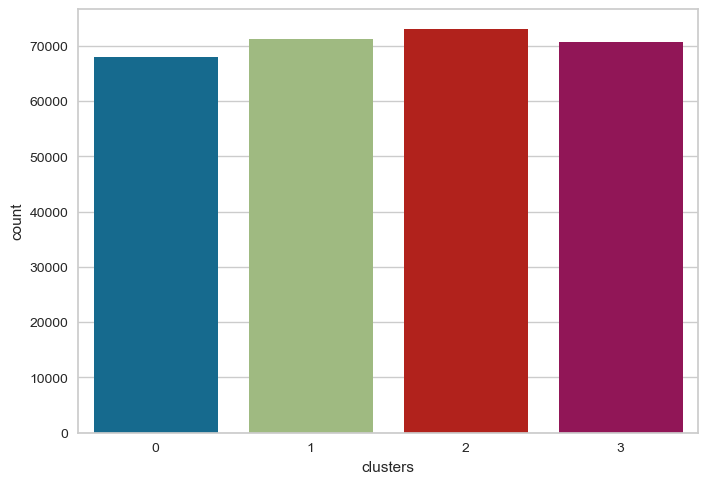

In [97]:
sns.countplot(x=df.clusters)

In [98]:
df.columns

Index(['Category', 'City', 'County', 'Customer Since', 'Date of Order',
       'Full Name', 'Gender', 'Item Id', 'Order Id', 'Payment Method',
       'Place Name', 'Ref Num', 'Region', 'State', 'User Name', 'Zip',
       'Qty Ordered', 'Total', 'clusters'],
      dtype='object')

<AxesSubplot:xlabel='Payment Method', ylabel='Count'>

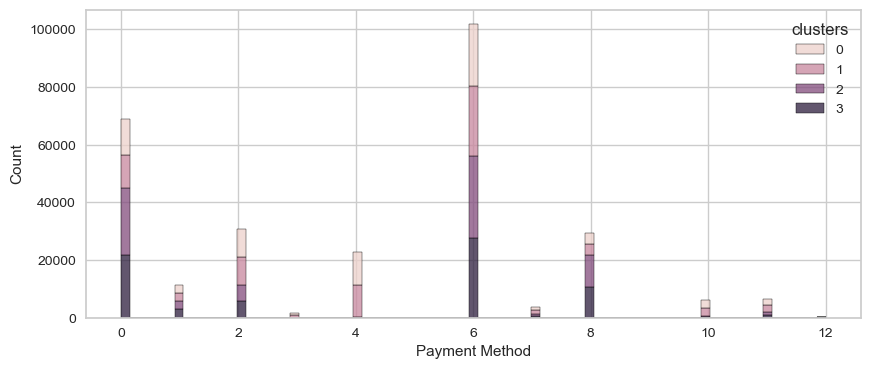

In [99]:
plt.figure(figsize=(10,4))
sns.histplot(x= "Payment Method",hue="clusters",multiple ="stack",data = df)

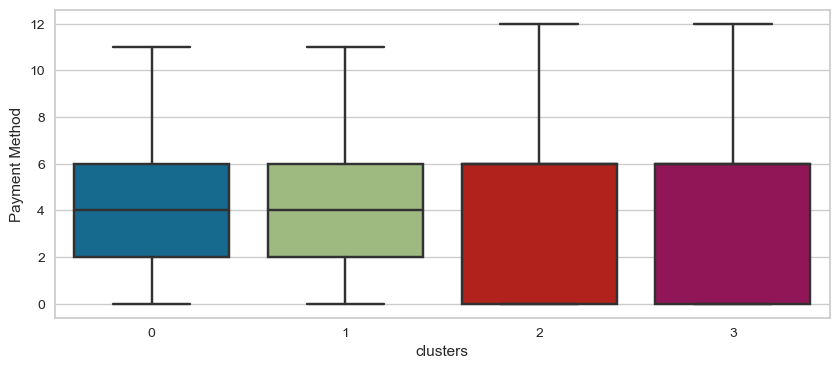

In [100]:
plt.figure(figsize=(10,4))
sns.boxplot(y= "Payment Method",x="clusters",data = df);

In [101]:
import plotly.express as px
import plotly.graph_objects as go

In [103]:
figure = px.scatter_3d(df,
                    color='clusters',
                    x="Gender",
                    y="Category",
                    z="Qty Ordered",
                    category_orders = {"clusters": ["0", "1", "2", "3"]}
                    )
figure.update_layout()
figure.show()